In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras import layers, models
import random
from sklearn.metrics import jaccard_score
import re

2024-08-22 22:06:15.886324: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
base = os.path.join(os.getcwd(), "COVID-19_Radiography_Dataset")
paths = [
    (os.path.join(base, 'Lung_Opacity', 'images'), os.path.join(base, 'Lung_Opacity', 'masks')),
    (os.path.join(base, 'Normal', 'images'), os.path.join(base, 'Normal', 'masks')),
    (os.path.join(base, 'COVID', 'images'), os.path.join(base, 'COVID', 'masks')),
    (os.path.join(base, 'Viral Pneumonia', 'images'), os.path.join(base, 'Viral Pneumonia', 'masks'))
]


# A look at ground truth masks and images

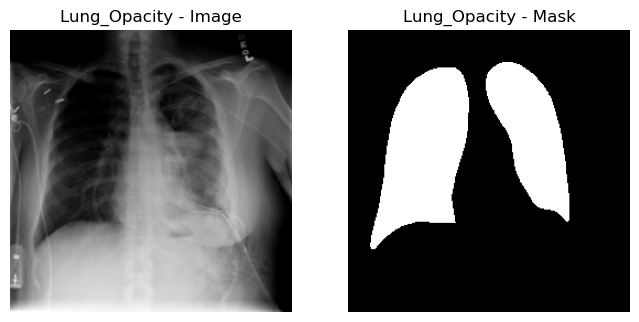

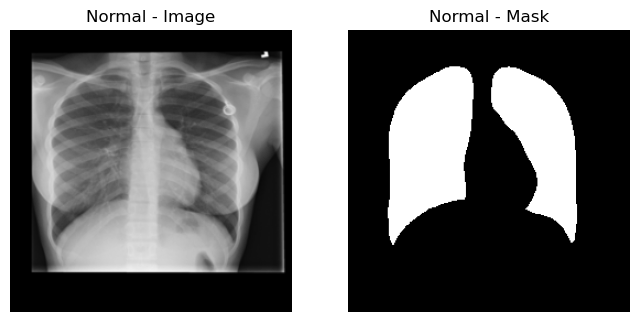

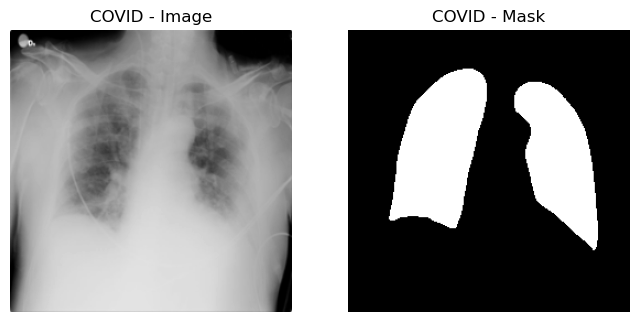

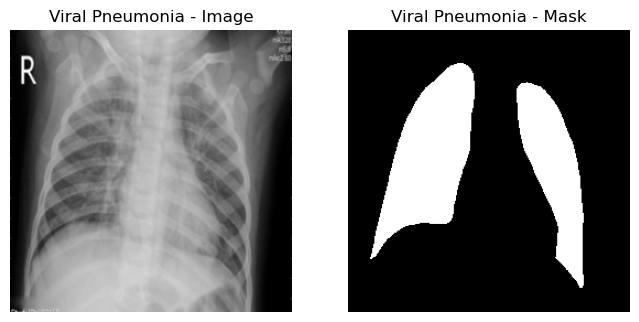

In [3]:
def load_and_preprocess_image(image_path, mask_path, img_size=256):
    # image load
    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, channels=1, expand_animations=False)
    image = tf.image.resize(image, [img_size, img_size])
    image = tf.cast(image, tf.float32) / 255.0

    # mask load
    mask = tf.io.read_file(mask_path)
    mask = tf.io.decode_image(mask, channels=1, expand_animations=False)
    mask = tf.image.resize(mask, [img_size, img_size])
    mask = tf.cast(mask, tf.float32) / 255.0

    return image, mask

def plot_image_and_mask(image, mask, title=""):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(tf.squeeze(image), cmap='gray')
    plt.title(f"{title} - Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(tf.squeeze(mask), cmap='gray')
    plt.title(f"{title} - Mask")
    plt.axis('off')

    plt.show()


def remove_small_islands(mask, min_size=800):

    # Ensure the mask is binary
    binary_mask = (mask > 0.5).astype(np.uint8)

    # Find connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

    # Create an empty mask to store the refined mask
    refined_mask = np.zeros_like(binary_mask)

    # Iterate over each component
    for label in range(1, num_labels):
        # Check the size of the component
        if stats[label, cv2.CC_STAT_AREA] >= min_size:
            # Keep components larger than min_size
            refined_mask[labels == label] = 1

    return refined_mask

# Data set paths
base_path = os.path.join(os.getcwd(), "COVID-19_Radiography_Dataset")
folders = ['Lung_Opacity', 'Normal', 'COVID', 'Viral Pneumonia']

for folder in folders:
    image_dir = os.path.join(base_path, folder, 'images')
    mask_dir = os.path.join(base_path, folder, 'masks')

    image_files = sorted(os.listdir(image_dir))
    mask_files = sorted(os.listdir(mask_dir))

    if image_files and mask_files:
        image_path = os.path.join(image_dir, image_files[0])
        mask_path = os.path.join(mask_dir, mask_files[0])

        image, mask = load_and_preprocess_image(image_path, mask_path)

        plot_image_and_mask(image, mask, title=folder)

# Model was fit to predict lung mask from image.  See model_fitting.ipynb

# Functions for loading model and visualizing lung masks.

In [4]:
from tensorflow.keras import layers, models
def process_image(image_path, target_size):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, channels=1, expand_animations=False)
    image = tf.image.resize(image, target_size)
    image = tf.cast(image, tf.float32) / 255.0  # Standardize
    return image

def build_pretrained(model_path):
# Load the model architecture
    input_shape = (256, 256, 1) 
    num_classes = 1  
    model = build_unet(input_shape, num_classes)

    # Load the best weights
    model.load_weights(model_path)
    return model


def get_sample_image(which,num):
    """Params:  Which (Normal,COVID,Viral Pneumonia, Lung_Opacity)"""
    base = os.path.join(os.getcwd(), "COVID-19_Radiography_Dataset")
    file=sorted(os.listdir(os.path.join(base, which, 'images')))
    image_path = os.path.join(base, which, 'images', file[num])
    return image_path


def plot_image_and_pred_mask(image_path,model):
    # Process the first image
    first_image = process_image(image_path, (256, 256))
    first_image = np.expand_dims(first_image, axis=0)  # Add batch dimension

    # Predict the mask
    predicted_mask = model.predict(first_image)

    # remove extra dimension
    predicted_mask = np.squeeze(predicted_mask)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(np.squeeze(first_image), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Mask")
    plt.imshow(predicted_mask, cmap='gray')
    plt.axis('off')

    plt.show()
def get_predicted_mask(image_path,model):
    image = process_image(image_path, (256, 256))
    image = np.expand_dims(image, axis=0)  # Add a dimension

    predicted_mask = model.predict(image)
    return predicted_mask
def apply_mask(image, mask, threshold=0.5):
    # Convert mask to binary
    binary_mask = (mask > threshold).astype(np.uint8)
    
    # Apply the mask to the image
    masked_image = image * binary_mask
    
    return masked_image

def show_reduced_xray(sample_image,predicted_mask,threshold=0.5):

    sample_image= np.squeeze(sample_image)  # Remove batch and channel dimensions if necessary
    predicted_mask = np.squeeze(predicted_mask)

    masked_image = apply_mask(sample_image, predicted_mask,threshold=threshold)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(sample_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Predicted Mask")
    plt.imshow(predicted_mask, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Masked Image")
    plt.imshow(masked_image, cmap='gray')
    plt.axis('off')

    plt.show()
def get_masked_image(sample_image,predicted_mask):
    sample_image= np.squeeze(sample_image)  
    predicted_mask = np.squeeze(predicted_mask)

    masked_image = apply_mask(sample_image, predicted_mask)
    return masked_image
def build_unet(input_shape, num_classes):
    inputs = layers.Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bridge
    b1 = conv_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output
    outputs = layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(d4)

    model = models.Model(inputs, outputs, name="U-Net")
    return model

def conv_block(inputs, filters):
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(inputs)
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    return x

def encoder_block(inputs, filters):
    x = conv_block(inputs, filters)
    p = layers.MaxPooling2D(2)(x)
    return x, p

def decoder_block(inputs, skip_features, filters):
    x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(inputs)
    x = layers.Concatenate()([x, skip_features])
    x = conv_block(x, filters)
    return x


# Analysis after first round of training unet model

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


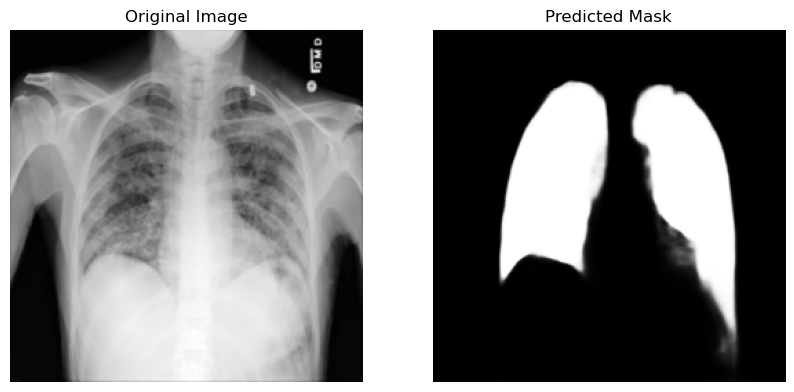

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step


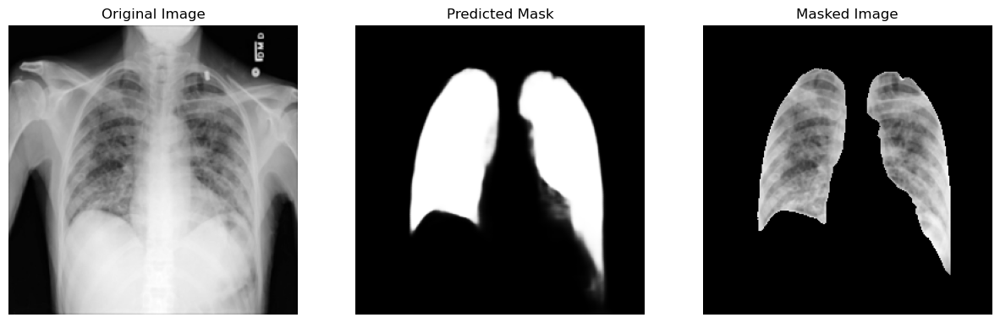

In [5]:
image_path=get_sample_image('Lung_Opacity',21)
model_path='best_model4.keras'
model=build_pretrained(model_path)
plot_image_and_pred_mask(image_path,model)
mask=get_predicted_mask(image_path,model)
sample_image=process_image(image_path,(256,256))
show_reduced_xray(sample_image,mask)

In [6]:
def process_and_evaluate_with_saved_masks(predicted_masks, ground_truth_paths):
    jaccard_indices_raw = []

    for pred_mask, mask_path in zip(predicted_masks, ground_truth_paths):
        # Load actual masks (ground truth)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # make shape the same
        if pred_mask.shape != mask.shape:
            pred_mask = cv2.resize(pred_mask, (mask.shape[1], mask.shape[0]))

        # Calculate Jaccard index for the prediction (no refinement)
        predicted_mask_flat = (pred_mask.flatten() > 0.5).astype(np.uint8)
        mask_flat = (mask.flatten() > 0.5).astype(np.uint8)
        jaccard_raw = jaccard_score(mask_flat, predicted_mask_flat, average='binary')
        jaccard_indices_raw.append(jaccard_raw)

    return np.mean(jaccard_indices_raw)

# Load in saved labels and predicted masks from first round of unet model training.  These predicted masks and corresponding ground truth masks will serve as a test set.  They contain 200 pneumonia, 200 covid and 400 Normal x-rays.

In [7]:
import re
labels=np.load('labels.npy') # Binary label (1 pneumonia/covid 0 Normal)
paths=np.load('paths.npy') #Relative paths to files
norm_paths=[os.path.normpath(path) for path in paths]
pred_masks=np.load('predicted_masks.npy')   #Predicted Mask From model 3
cleaned_ground_truth = [re.sub('/images/', '/masks/', item) for item in paths]
cleaned_ground_truth = [os.path.normpath(path) for path in cleaned_ground_truth]
paths=norm_paths

# Jaccard Score for Test Set

In [8]:
mean_jaccard_index_raw= process_and_evaluate_with_saved_masks(
    pred_masks, cleaned_ground_truth)
print(f'Jaccard Score After first round of unet training: {mean_jaccard_index_raw}')

Jaccard Score After first round of unet training: 0.9277455236174842


In [9]:
def evaluate_model_on_samples(model, base_dir, num_samples=5):
    subfolders = [f.path for f in os.scandir(base_dir) if f.is_dir()]
    all_jaccard_scores = []

    for subfolder in subfolders:
        image_files = [f for f in os.listdir(subfolder) if f.endswith(('.png', '.jpg', '.jpeg'))]
        sampled_files = random.sample(image_files, min(num_samples, len(image_files)))

        predicted_masks = []
        ground_truth_paths = []

        for image_file in sampled_files:
            image_path = os.path.join(subfolder, image_file)
            mask_path = image_path.replace('images', 'masks')  

            predicted_mask = get_predicted_mask(image_path, model)
            predicted_masks.append(predicted_mask)
            ground_truth_paths.append(mask_path)

        jaccard_score = process_and_evaluate_with_saved_masks(predicted_masks, ground_truth_paths)
        all_jaccard_scores.append(jaccard_score)
        print(f"Jaccard score for {subfolder}: {jaccard_score}")

    overall_jaccard_score = np.mean(all_jaccard_scores)
    print(f"Overall Jaccard score: {overall_jaccard_score}")



In [10]:

def process_lung_images_with_masks(image_paths, predicted_masks, target_size=(256, 256), threshold=0.5, remove_non_lung_areas=True):
    """
    Inludes option to only crop the imaage to the lungs, instead of removing all non-lung areas.

    """
    processed_images = []

    for image_path, predicted_mask in zip(image_paths, predicted_masks):
        # Load and preprocess the image
        image = tf.io.read_file(image_path)
        image = tf.io.decode_image(image, channels=1, expand_animations=False)
        image = tf.image.resize(image, target_size)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize

        # Ensure the predicted mask is the same size as the image
        predicted_mask = tf.image.resize(predicted_mask, target_size)
        predicted_mask = tf.squeeze(predicted_mask)  # Remove any extra dimensions

        # Convert mask to binary
        binary_mask = (predicted_mask > threshold).numpy().astype(np.uint8)

        if remove_non_lung_areas:
            # Apply the mask to the image
            masked_image = np.squeeze(image.numpy()) * binary_mask
        else:
            # Use the original image
            masked_image = np.squeeze(image.numpy())

        # Find the bounding box of the mask
        coords = np.column_stack(np.where(binary_mask > 0))
        if coords.size == 0:
            # If the mask is empty, use the whole image
            cropped_image = masked_image
        else:
            y_min, x_min = coords.min(axis=0)[:2]  # Ensure only two coordinates are used
            y_max, x_max = coords.max(axis=0)[:2]

            # Crop the image to the bounding box
            cropped_image = masked_image[y_min:y_max+1, x_min:x_max+1]

        # Ensure the cropped image has 3 dimensions before resizing
        if len(cropped_image.shape) == 2:
            cropped_image = np.expand_dims(cropped_image, axis=-1)

        # Resize the cropped image to the target size
        cropped_image = tf.image.resize(cropped_image, target_size)
        processed_images.append(cropped_image.numpy())

    return np.array(processed_images)

cropped_images=process_lung_images_with_masks(paths, pred_masks)

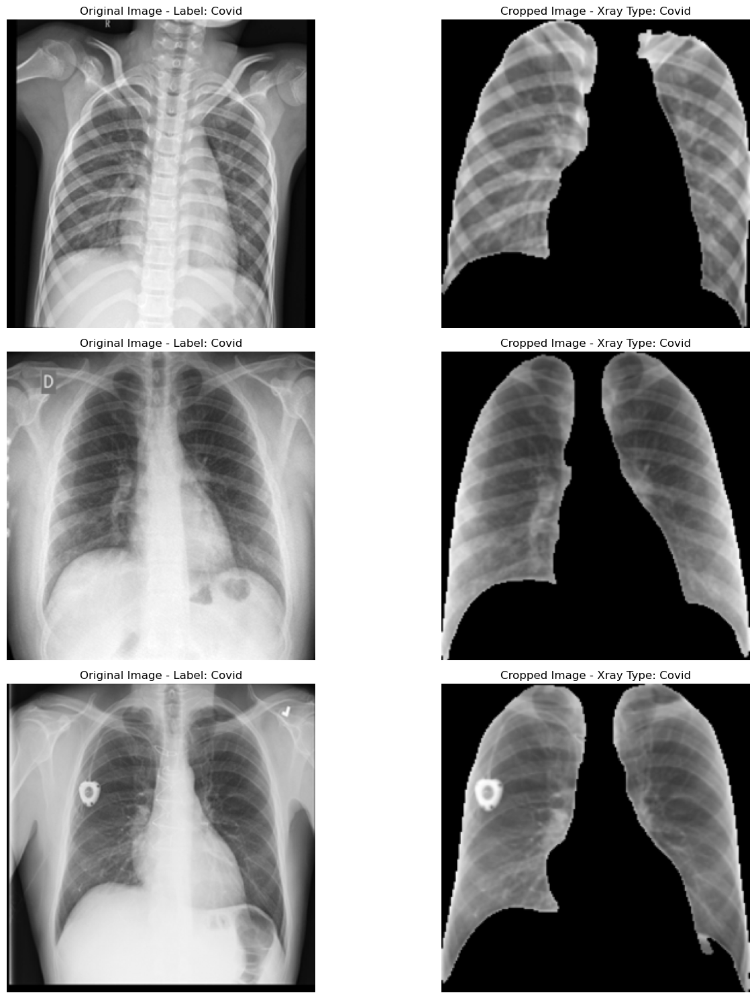

In [11]:
def plot_images_with_labels(paths, cropped_images, labels, indices):

    plt.figure(figsize=(15, 5 * len(indices)))

    for i, idx in enumerate(indices):

        original_image = cv2.imread(paths[idx], cv2.IMREAD_GRAYSCALE)

        plt.subplot(len(indices), 2, 2 * i + 1)
        plt.imshow(original_image, cmap='gray')
        plt.title(f"Original Image - Label: {get_label_from_path_name(paths[idx])}")
        plt.axis('off')

        plt.subplot(len(indices), 2, 2 * i + 2)
        plt.imshow(np.squeeze(cropped_images[idx]), cmap='gray')

        plt.title(f"Cropped Image - Xray Type: {get_label_from_path_name(paths[idx])}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
def get_label_from_path_name(path):
    path_components = path.split(os.path.sep)
    if 'Lung_Opacity-' in path:
        return 'Lung Opacity'
    elif 'COVID-' in path:
        return 'Covid'
    elif 'Viral Pneumonia-' in path:
        return 'Viral Pneumonia'
    else:
        return 'Normal'
indices=[10,391,610]
plot_images_with_labels(paths, cropped_images, labels, indices)

# List of problematic Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


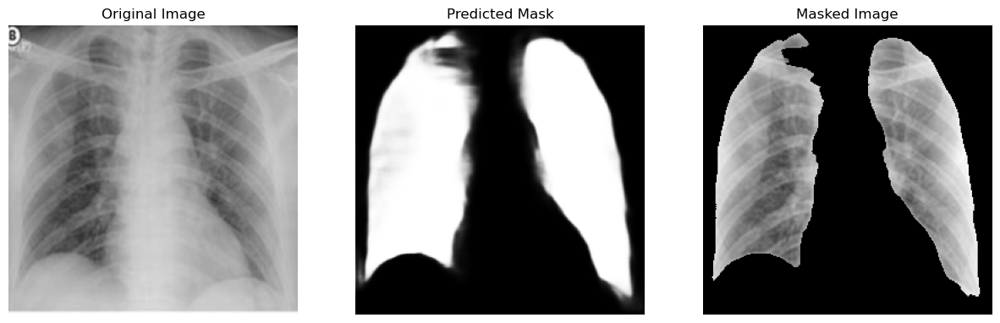

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


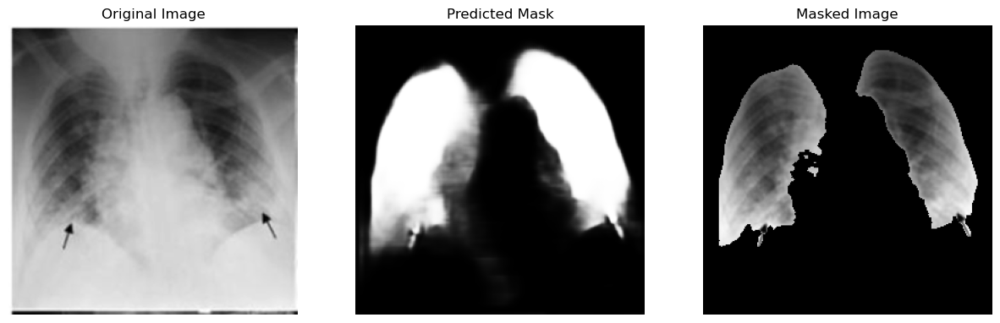

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


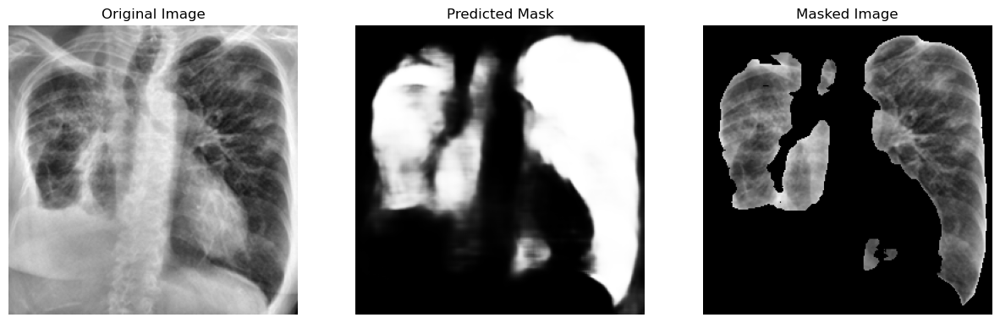

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


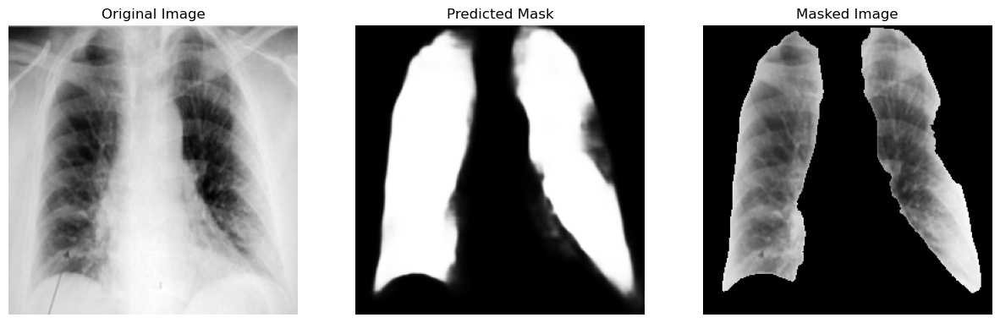

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


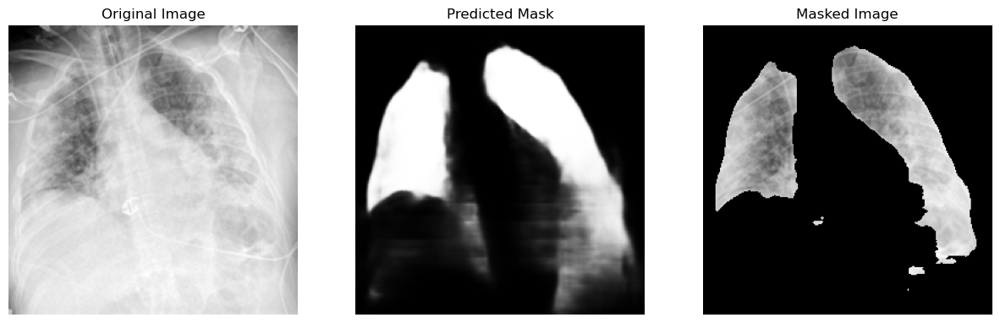

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


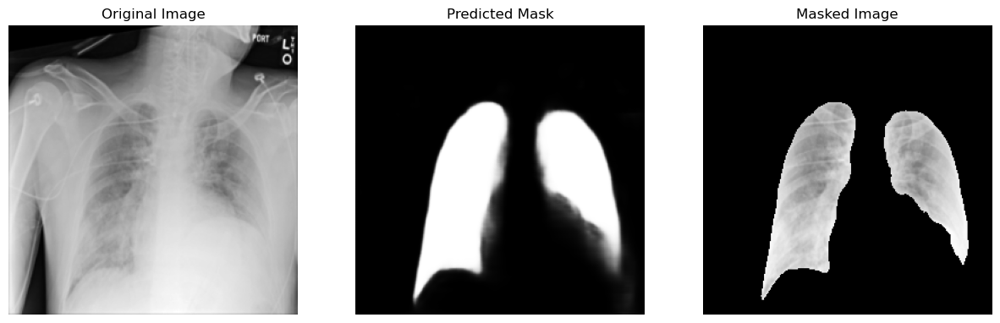

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


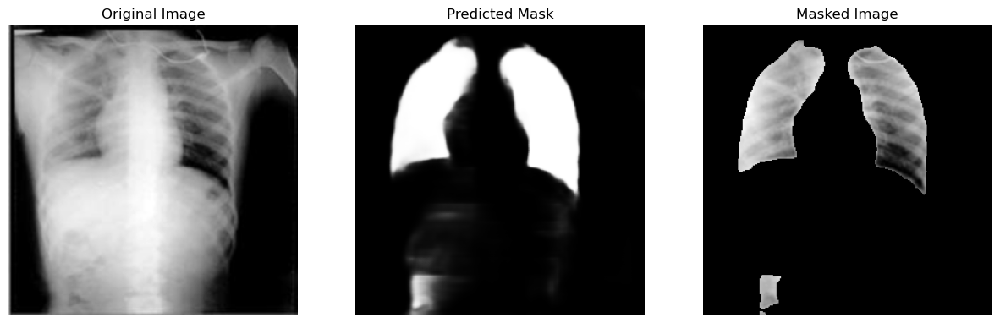

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


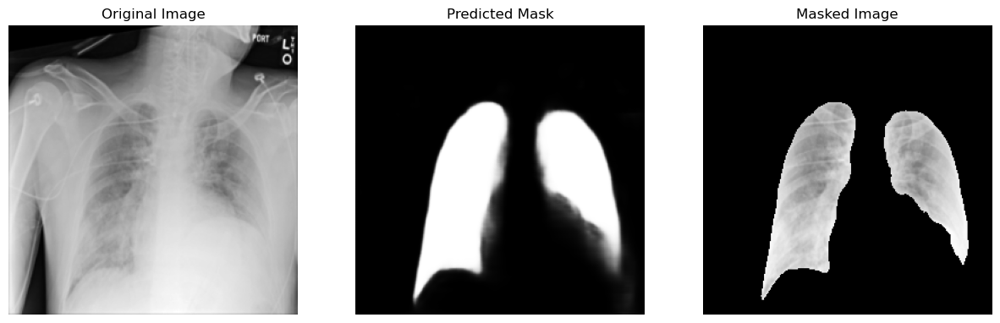

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


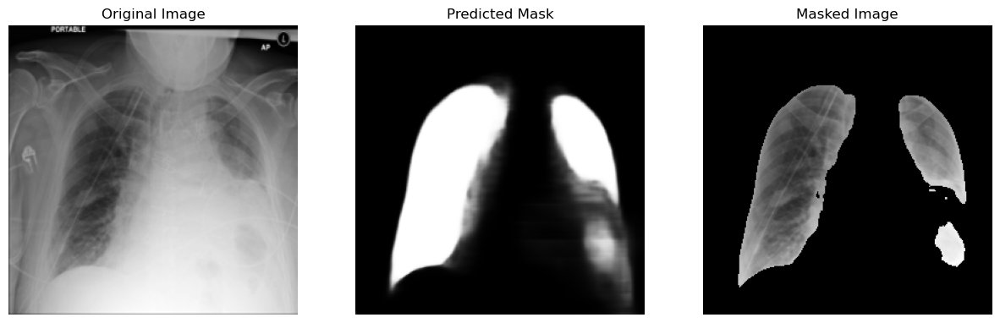

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


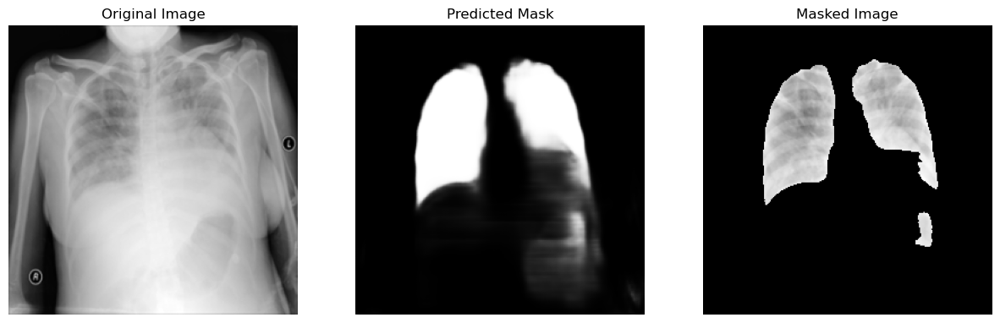

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


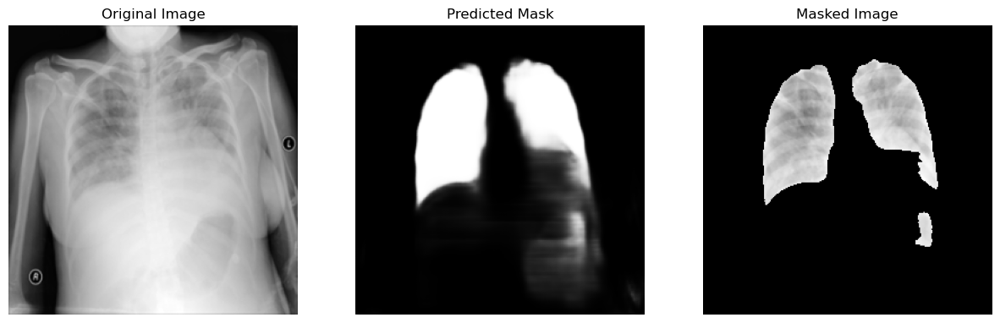

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


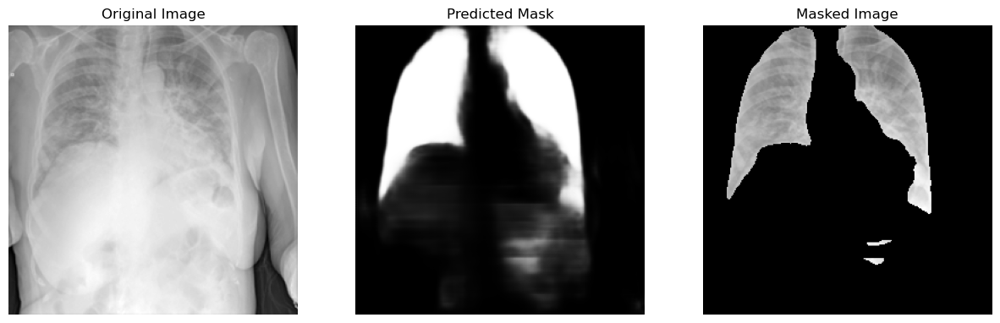

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


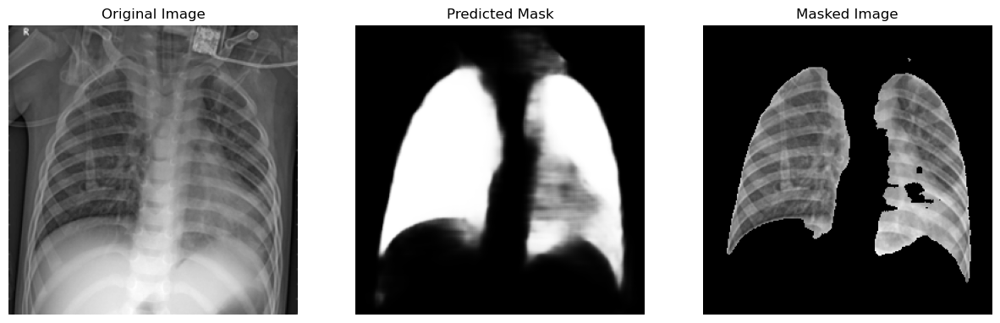

In [12]:

problamatic_images=['COVID-19_Radiography_Dataset/COVID/images/COVID-1093.png',
                    "COVID-19_Radiography_Dataset/COVID/images/COVID-1237.png",
                   "COVID-19_Radiography_Dataset/COVID/images/COVID-1321.png",
                   "COVID-19_Radiography_Dataset/COVID/images/COVID-1211.png",
                   "COVID-19_Radiography_Dataset/COVID/images/COVID-1106.png",
                   "COVID-19_Radiography_Dataset/Lung_Opacity/images/Lung_Opacity-1884.png",
                   "COVID-19_Radiography_Dataset/COVID/images/COVID-1541.png",
                    "COVID-19_Radiography_Dataset/Lung_Opacity/images/Lung_Opacity-1884.png",
                   "COVID-19_Radiography_Dataset/Lung_Opacity/images/Lung_Opacity-1298.png",
                   "COVID-19_Radiography_Dataset/Lung_Opacity/images/Lung_Opacity-5283.png",
                   "COVID-19_Radiography_Dataset/Lung_Opacity/images/Lung_Opacity-5283.png",
                   "COVID-19_Radiography_Dataset/COVID/images/COVID-807.png",
                   "COVID-19_Radiography_Dataset/Viral Pneumonia/images/Viral Pneumonia-15.png"]

problamatic_images=[os.path.normpath(path) for path in problamatic_images]
holes=[os.path.join("COVID-19_Radiography_Dataset","Viral Pneumonia","images","Viral Pneumonia-15.png")]
problamatic_pred_masks=[]
for path in problamatic_images:
    image_path = os.path.join(os.getcwd(), path)
    model_path = 'best_model4.keras'
    model = build_pretrained(model_path)
    mask = get_predicted_mask(image_path, model)
    sample_image = process_image(image_path, (256, 256))
    show_reduced_xray(sample_image, mask)
    problamatic_pred_masks.append(mask)
problamatic_pred_masks=np.array(problamatic_pred_masks)

# Refine predicted masks using morphological closing

In [13]:
def sample_images_and_masks(paths, sample_sizes):
    image_paths = []
    mask_paths = []
    for (image_dir, mask_dir) in paths:
        category = os.path.basename(os.path.dirname(image_dir))
        num_samples = sample_sizes.get(category, 0)

        image_files = sorted(os.listdir(image_dir))
        mask_files = sorted(os.listdir(mask_dir))
        
        # Randomly sample the specified number of files
        sampled_indices = np.random.choice(len(image_files), num_samples, replace=False)
        image_paths.extend([os.path.join(image_dir, image_files[i]) for i in sampled_indices])
        mask_paths.extend([os.path.join(mask_dir, mask_files[i]) for i in sampled_indices])
    
    return image_paths, mask_paths
def get_predicted_mask(image_path, model):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, channels=1, expand_animations=False)
    image = tf.image.resize(image, (256, 256))
    image = tf.cast(image, tf.float32) / 255.0  
    image = tf.expand_dims(image, axis=0)  

    # Predict the mask
    predicted_mask = model.predict(image)
    predicted_mask = tf.squeeze(predicted_mask) 
    return predicted_mask.numpy()

def has_holes(mask, max_hole_size=50):
    # Ensure binary
    binary_mask = (mask > 0.5).astype(np.uint8)

    # invert the mask to find holes
    inverted_mask = 1 - binary_mask

    # Find connected components in the inverted mask
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(inverted_mask, connectivity=8)

    # Check for small holes
    for label in range(1, num_labels):
        if stats[label, cv2.CC_STAT_AREA] <= max_hole_size:
            return True
    return False
def fill_vertical_gaps(mask, max_gap=25):
    # check binary
    binary_mask = np.squeeze(mask)
    binary_mask = (binary_mask > 0.5).astype(np.uint8)

    # 2d check
    if binary_mask.ndim != 2:
        raise ValueError("Mask must be a 2D array")

    # Kernel
    kernel = np.ones((max_gap, 1), np.uint8)

    # fill
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Exclude filling gaps at the borders
    closed_mask[:max_gap, :] = binary_mask[:max_gap, :]
    closed_mask[-max_gap:, :] = binary_mask[-max_gap:, :]

    return closed_mask

def fill_horizontal_gaps(mask, max_gap=25):
    binary_mask = (mask > 0.5).astype(np.uint8)
    horizontal_kernel = np.ones((1, max_gap), np.uint8)
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, horizontal_kernel)

    closed_mask[:, :max_gap] = binary_mask[:, :max_gap]
    closed_mask[:, -max_gap:] = binary_mask[:, -max_gap:]
    return closed_mask


def process_lung_images_with_masks(image_paths, predicted_masks, target_size=(256, 256), threshold=0.5, remove_non_lung_areas=True):

    processed_images = []

    for image_path, predicted_mask in zip(image_paths, predicted_masks):
        image = tf.io.read_file(image_path)
        image = tf.io.decode_image(image, channels=1, expand_animations=False)
        image = tf.image.resize(image, target_size)
        image = tf.cast(image, tf.float32) / 255.0

        predicted_mask = tf.image.resize(predicted_mask, target_size)
        predicted_mask = tf.squeeze(predicted_mask)

        binary_mask = (predicted_mask > threshold).numpy().astype(np.uint8)

        if remove_non_lung_areas:
            masked_image = np.squeeze(image.numpy()) * binary_mask
        else:
            masked_image = np.squeeze(image.numpy())

        # Ensure the masked image retains the original size
        if len(masked_image.shape) == 2:
            masked_image = np.expand_dims(masked_image, axis=-1)

        processed_images.append(masked_image)

    return np.array(processed_images)



def remove_and_crop(image_paths, predicted_masks, target_size=(256, 256), threshold=0.5, remove_non_lung_areas=True, padding=0):
    """
    Process images using predicted masks to either remove non-lung areas or just crop to lung regions.

    """
    processed_images = []
    
    for image_path, predicted_mask in zip(image_paths, predicted_masks):
        image = tf.io.read_file(image_path)
        image = tf.io.decode_image(image, channels=1, expand_animations=False)
        image = tf.image.resize(image, target_size)
        image = tf.cast(image, tf.float32) / 255.0

        predicted_mask = tf.image.resize(predicted_mask, target_size)
        predicted_mask = tf.squeeze(predicted_mask)

        binary_mask = (predicted_mask > threshold).numpy().astype(np.uint8)

        if remove_non_lung_areas:
            masked_image = np.squeeze(image.numpy()) * binary_mask
        else:
            masked_image = np.squeeze(image.numpy())

        coords = np.column_stack(np.where(binary_mask > 0))
        if coords.size == 0:
            cropped_image = masked_image
        else:
            y_min, x_min = coords.min(axis=0)[:2]
            y_max, x_max = coords.max(axis=0)[:2]
            cropped_image = masked_image[y_min:y_max+1, x_min:x_max+1]

            # Ensure the cropped image has 3 dimensions (height, width, channels)
            if len(cropped_image.shape) == 2:
                cropped_image = np.expand_dims(cropped_image, axis=-1)

            # Add padding to the left and right sides
            padded_image = tf.image.pad_to_bounding_box(
                tf.convert_to_tensor(cropped_image, dtype=tf.float32),
                offset_height=0,
                offset_width=padding,
                target_height=cropped_image.shape[0],
                target_width=cropped_image.shape[1] + 2 * padding
            )

        padded_image = tf.image.resize(padded_image, target_size)
        processed_images.append(padded_image.numpy())

    return np.array(processed_images)

def remove_small_objects(mask, min_size=100):
    num_labels, labels_im = cv2.connectedComponents(mask)

    cleaned_mask = np.zeros(mask.shape, dtype=np.uint8)

    for label in range(1, num_labels):
        component_mask = (labels_im == label).astype(np.uint8)

        if cv2.countNonZero(component_mask) >= min_size:
            cleaned_mask = cv2.bitwise_or(cleaned_mask, component_mask)

    return cleaned_mask

def clear_directory(directory):
    """Remove all files in the specified directory."""
    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)  # Remove the file
        except Exception as e:
            print(f'Failed to delete {file_path}. Reason: {e}')

def pipeline_remove_fill_crop(paths, model, output_dir=None, remove_heart=True, return_masks=False):
    refined_masks = []

    if output_dir:
        # Ensure the output directory exists
        os.makedirs(output_dir, exist_ok=True)
        # Clear the directory before processing
        clear_directory(output_dir)

    for path in paths:
        predicted_mask = get_predicted_mask(path, model)

        if has_holes(predicted_mask):
            vertically_filled_mask = fill_vertical_gaps(predicted_mask, max_gap=19)
            filled_mask = fill_horizontal_gaps(vertically_filled_mask, max_gap=13)
            filled_mask = fill_vertical_gaps(filled_mask, max_gap=12)
        else:
            filled_mask = predicted_mask

        refined_mask = refine_mask(filled_mask, min_size=800)
        refined_mask = refined_mask.reshape((1, 256, 256, 1))
        refined_masks.append(refined_mask)

        cropped_image = process_lung_images_with_masks(
            np.array([path]), 
            np.array([refined_mask]), 
            remove_non_lung_areas=remove_heart, 
            target_size=(256, 256), 
            threshold=0.5
        )[0]

        if output_dir:
            filename = os.path.basename(path)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, (cropped_image * 255).astype(np.uint8))

    if return_masks:
        return refined_masks


def refine_mask(mask, min_size=800):
    """
    removes small connected components.
    """
    binary_mask = (mask > 0.5).astype(np.uint8)

    # Find connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

    # Create an empty mask to store the refined mask
    refined_mask = np.zeros_like(binary_mask)

    # Iterate over each component
    for label in range(1, num_labels):
        # Check the size of the component
        if stats[label, cv2.CC_STAT_AREA] >= min_size:
            # Keep components larger than min_size
            refined_mask[labels == label] = 1

    return refined_mask


def plot_masked_images(image_paths, original_masks, refined_masks):
    original_masked_images = process_lung_images_with_masks(image_paths, original_masks, remove_non_lung_areas=True)
    refined_masked_images = process_lung_images_with_masks(image_paths, refined_masks, remove_non_lung_areas=True)

    for i, (image_path, original_masked, refined_masked) in enumerate(zip(image_paths, original_masked_images, refined_masked_images)):
        original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(original_image, cmap='gray')
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        axes[1].imshow(np.squeeze(original_masked), cmap='gray')
        axes[1].set_title('Original Masked Image')
        axes[1].axis('off')

        axes[2].imshow(np.squeeze(refined_masked), cmap='gray')
        axes[2].set_title('Refined Masked Image')
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()



In [14]:
refined_problem_images=pipeline_remove_fill_crop(problamatic_images, model, output_dir=None, remove_heart=True, return_masks=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


# Problematic images after refinement

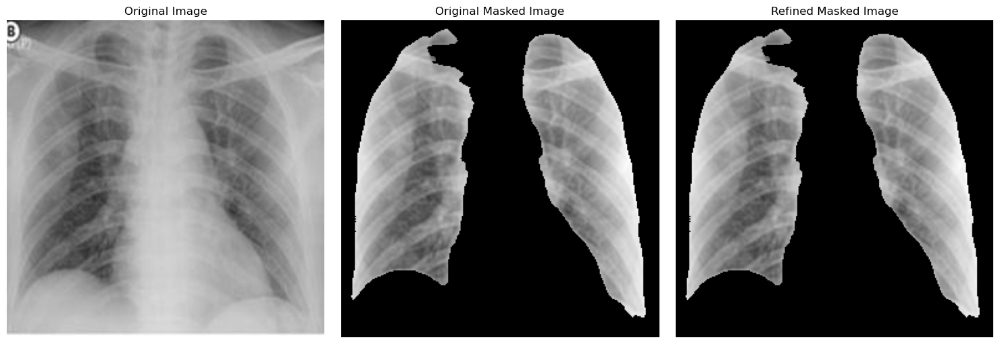

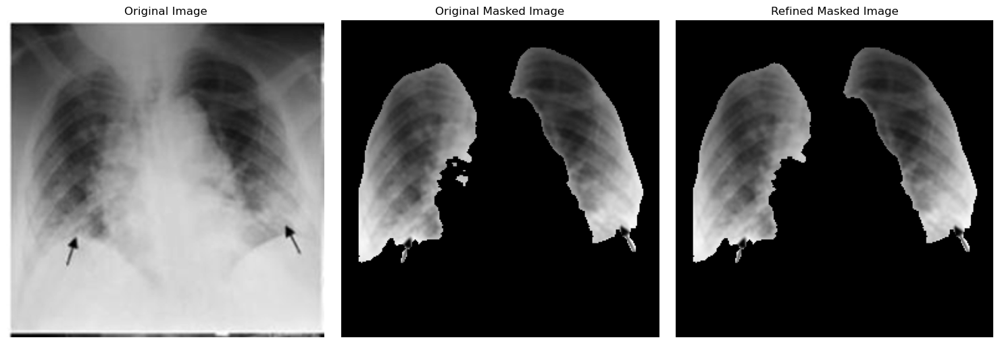

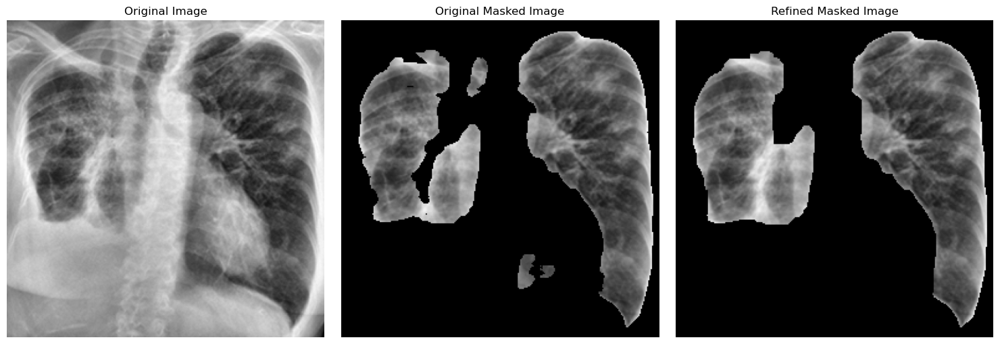

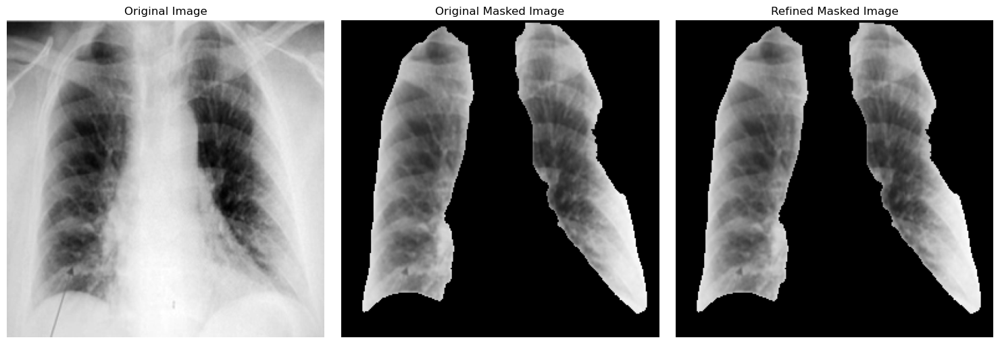

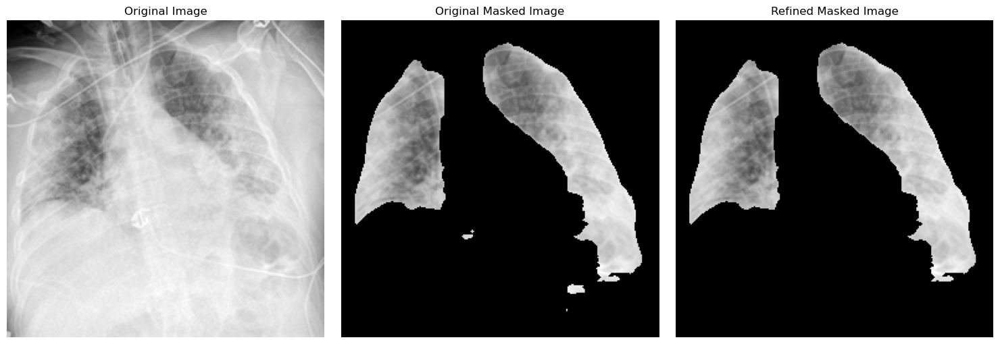

...

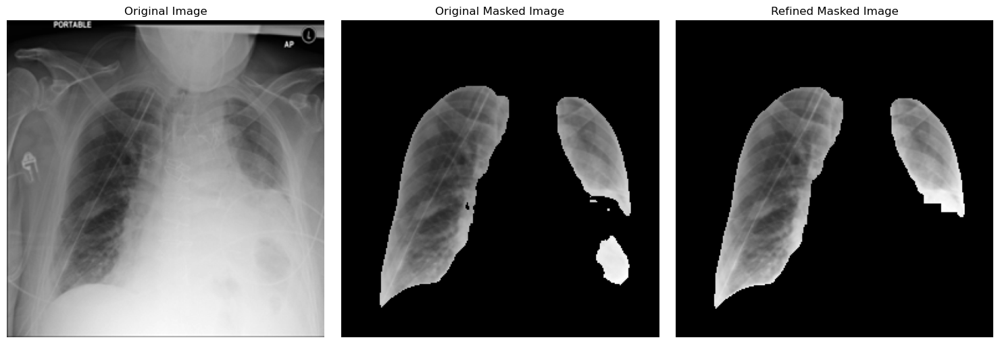

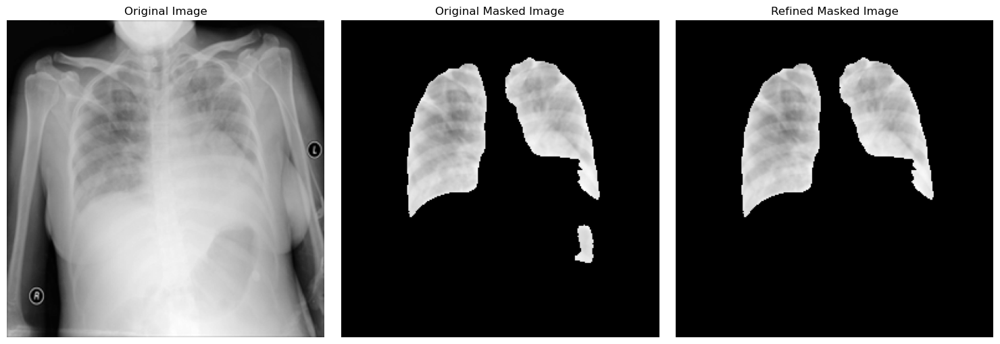

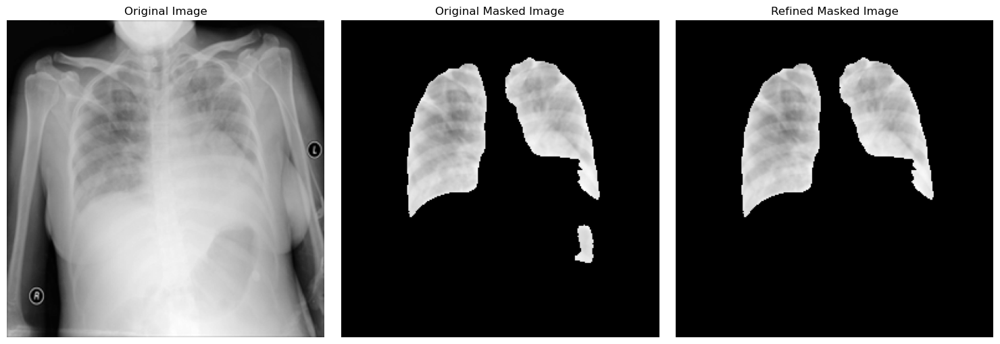

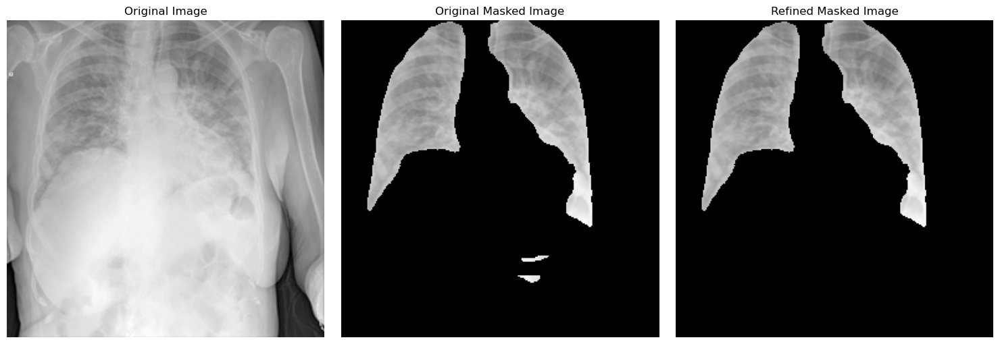

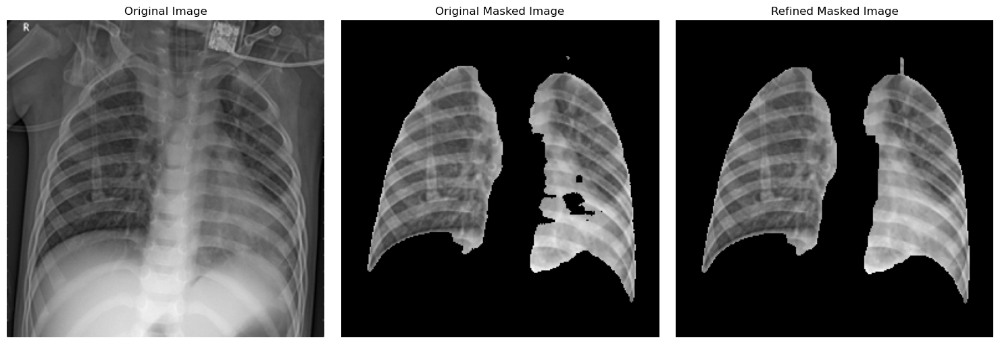

In [15]:
plot_masked_images(problamatic_images, problamatic_pred_masks, refined_problem_images)

In [16]:
RERUN=False

labels=np.load('labels.npy')
paths=np.load('paths.npy')
norm_paths = [os.path.normpath(path) for path in paths]
pred_masks=np.load('predicted_masks.npy')
ground_truth_masks=[re.sub('/images/', '/masks/', item) for item in paths]
ground_truth_masks= [os.path.normpath(path) for path in ground_truth_masks]
paths=norm_paths
if RERUN:
    refined_masks=pipeline_remove_fill_crop(paths, model, output_dir=None, remove_heart=True, return_masks=True)
    refined_masks=np.array(refined_masks)
    np.save('refined_masks1.npy',refined_masks)
else:
    refined_masks=np.load('refined_masks1.npy')
    refined_masks=np.squeeze(refined_masks)
    

# Jaccard Score for test set (refined masks)

In [17]:
refined_masks=np.squeeze(refined_masks)
mean_jaccard_index_refined= process_and_evaluate_with_saved_masks(
    refined_masks, ground_truth_masks)

In [18]:
print('Jaccard Score After Refinement' ,mean_jaccard_index_refined)

Jaccard Score After Refinement 0.9278474932941606


**We see a very slight improvement in the Jaccard score**

# At this point I continued to fit the model to improve the mask predictions.  best_model6.keras was built on top of best_model4.keras.  The model was fit for an additional 9 epochs.  The accuracy score on the validation set was improved from 0.9833 (best_model4) to 0.9866.

In [19]:
model_path='best_model6.keras'
model=build_pretrained(model_path)
new_masks=np.array([get_predicted_mask(mask,model) for mask in problamatic_images])


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 921ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 945ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 967ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 962ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step


In [20]:
new_masks=np.squeeze(new_masks)
new_masks = np.array([np.expand_dims(np.squeeze(mask), axis=-1) if len(np.squeeze(mask).shape) == 2 else mask for mask in new_masks])


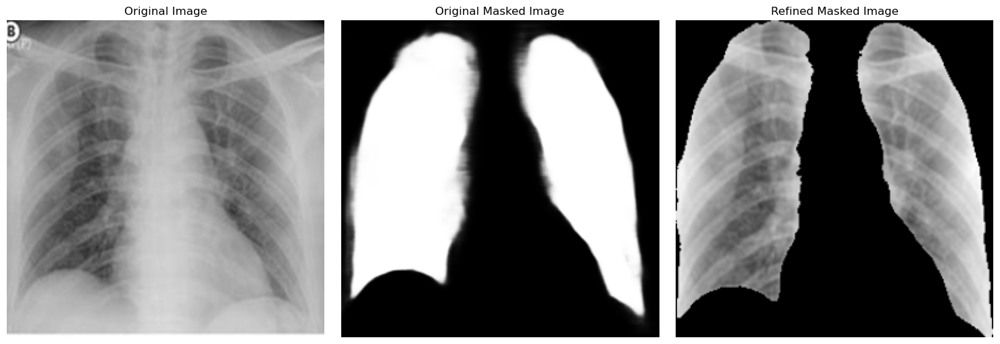

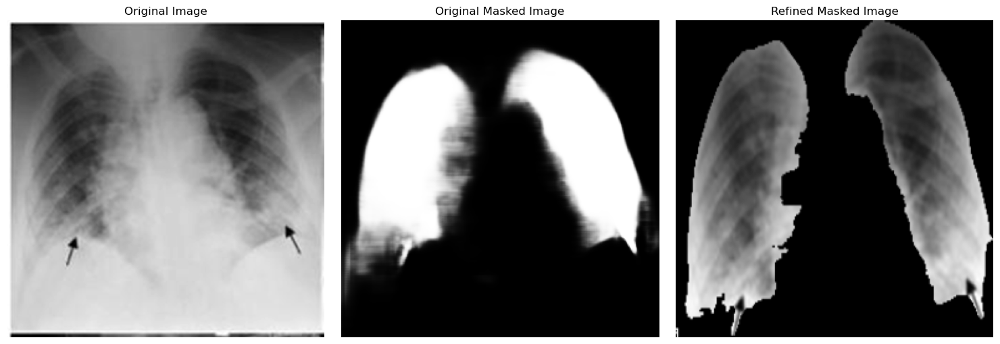

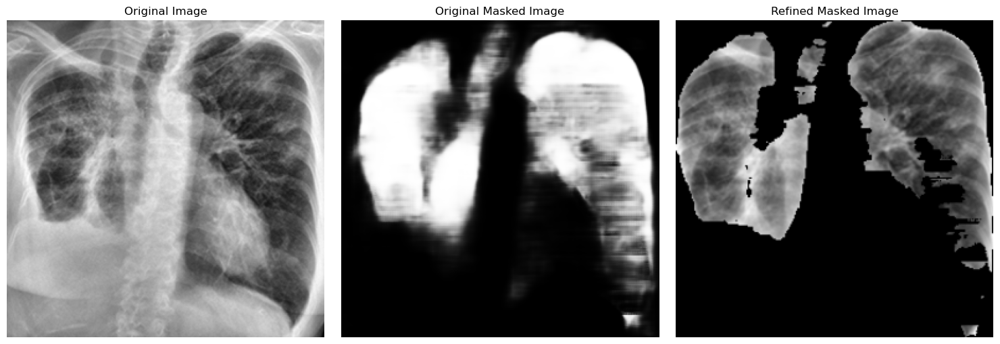

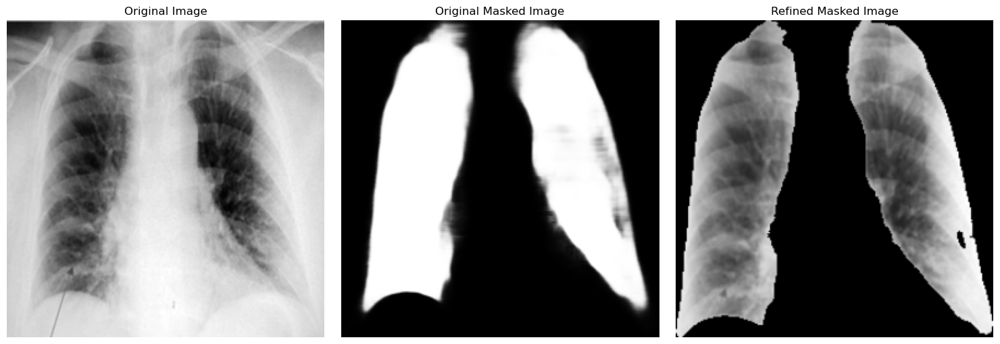

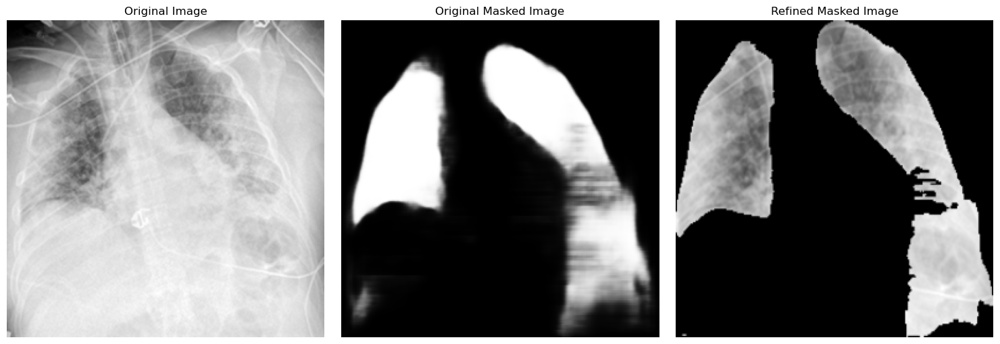

...

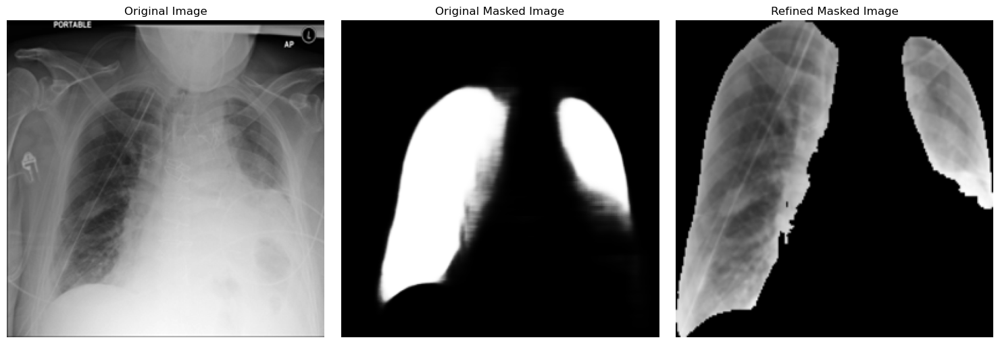

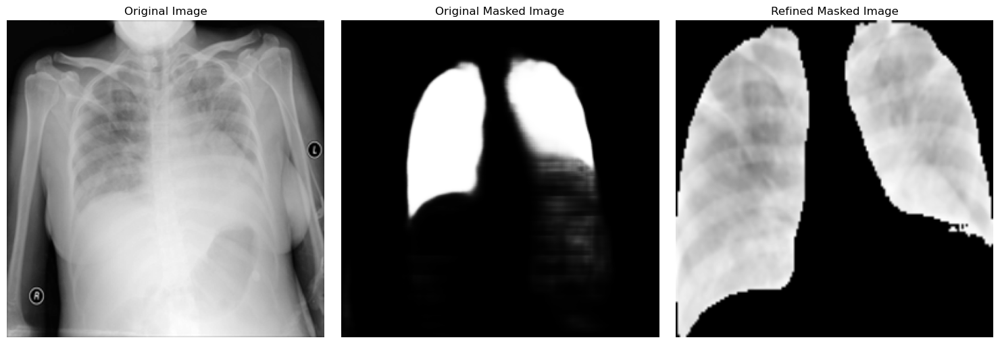

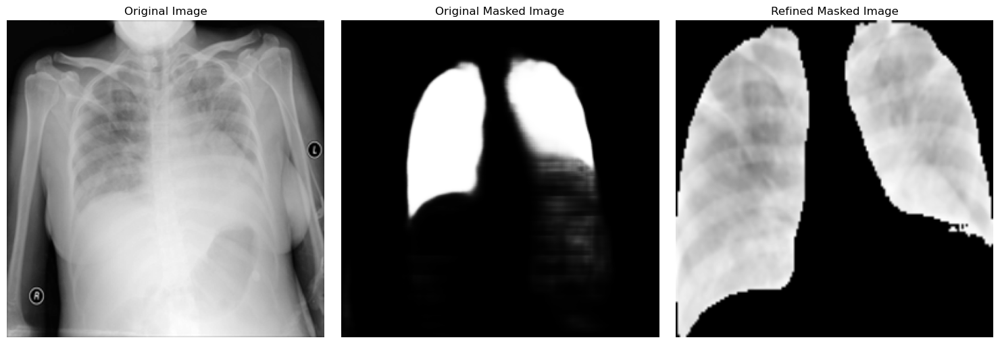

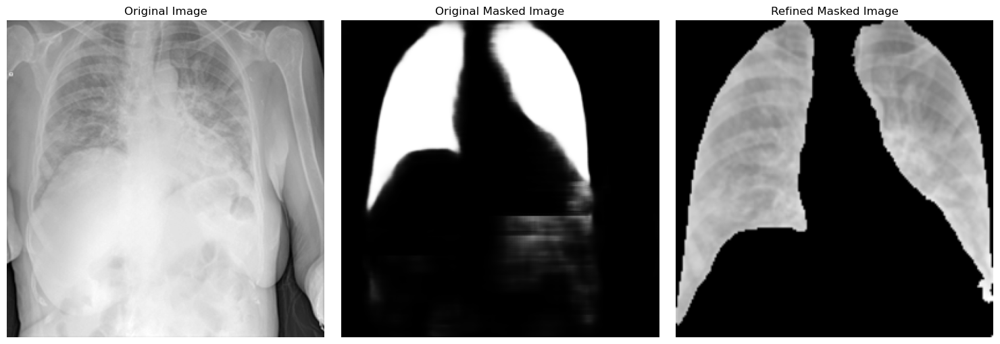

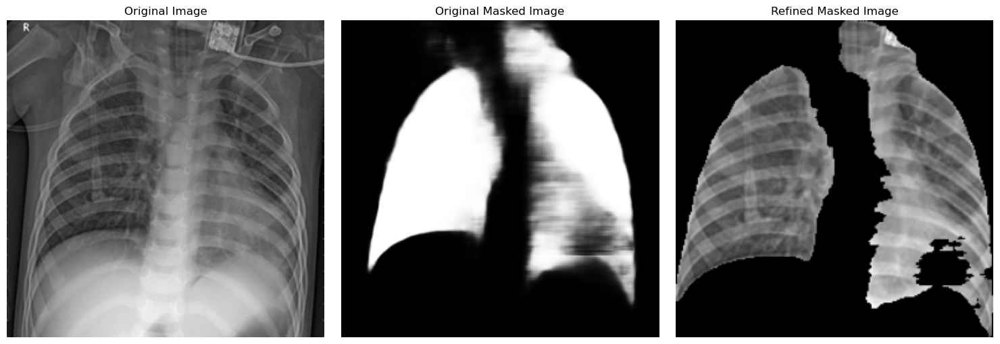

In [21]:
refined_new_masks=remove_and_crop(problamatic_images, new_masks)
refined_new_masks=np.squeeze(refined_new_masks)
for i, (image_path, original_masked, refined_masked) in enumerate(zip(problamatic_images, new_masks, refined_new_masks)):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(original_image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(np.squeeze(original_masked), cmap='gray')
    axes[1].set_title('Original Masked Image')
    axes[1].axis('off')

    axes[2].imshow(np.squeeze(refined_masked), cmap='gray')
    axes[2].set_title('Refined Masked Image')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()





# The first one is clearly an improvement the rest it is hard to tell.  It seems like model 6 is predicting more areas as lung.  Some of the images appear to look them worsebut they may have more correctly classified pixels.

# Jaccard Score with new model

In [22]:
RERUN=False
if RERUN:
    all_new_masks=np.array([get_predicted_mask(mask,model) for mask in paths])
    np.save('predicted_masks_model6.npy',all_new_masks)
else:
    all_new_masks=np.load('predicted_masks_model6.npy')
#ground_truth_masks=[re.sub('/images/', '/masks/', item) for item in paths]
mean_jaccard_index_new_non_refined= process_and_evaluate_with_saved_masks(
    all_new_masks, ground_truth_masks)
print('Jaccard Score after model 6 (no refinement)', mean_jaccard_index_new_non_refined)

Jaccard Score after model 6 (no refinement) 0.946713022845746


**Regardless of how the problematic images look, the new model has produced masks that are more accurate**

In [23]:
def pipeline_remove_fill_crop3(path, predicted_masks, model, output_dir=None, remove_heart=True, return_masks=False):
    """Takes predicted masks instead of model"""
    refined_masks = []

    if output_dir:
        # Ensure the output directory exists
        os.makedirs(output_dir, exist_ok=True)
        # Clear the directory before processing
        clear_directory(output_dir)

    for predicted_mask, path in zip(predicted_masks, paths):
        if has_holes(predicted_mask):
            vertically_filled_mask = fill_vertical_gaps(predicted_mask, max_gap=19)
            filled_mask = fill_horizontal_gaps(vertically_filled_mask, max_gap=13)
            filled_mask = fill_vertical_gaps(filled_mask, max_gap=12)
        else:
            filled_mask = predicted_mask

        refined_mask = refine_mask(filled_mask, min_size=850)
        refined_mask = refined_mask.reshape((1, 256, 256, 1))
        refined_masks.append(refined_mask)

        cropped_image = process_lung_images_with_masks(
            np.array([path]), 
            np.array([refined_mask]), 
            remove_non_lung_areas=remove_heart, 
            target_size=(256, 256), 
            threshold=0.5
        )[0]

        if output_dir:
            filename = os.path.basename(path)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, (cropped_image * 255).astype(np.uint8))

    if return_masks:
        return refined_masks

In [24]:
refined_new_masks_all=pipeline_remove_fill_crop3(paths, all_new_masks, model, output_dir=None, remove_heart=True, return_masks=True)
refined_new_masks_all=np.squeeze(refined_new_masks_all)
refined_new_masks_all = np.array([np.expand_dims(np.squeeze(mask), axis=-1) if len(np.squeeze(mask).shape) == 2 else mask for mask in refined_new_masks_all])


# Jaccard Score with new model and Refinement

In [25]:
mean_jaccard_index_new_refined= process_and_evaluate_with_saved_masks(
    refined_new_masks_all, ground_truth_masks)
print('Jaccard Score after model 6 (with refinement)', mean_jaccard_index_new_refined)

Jaccard Score after model 6 (with refinement) 0.9467405750923718


**The slightess improvement from the refinement**

# Histogram Equalization

In [26]:

def histogram_equalization(image):
    # Convert the image to a numpy array
    image_np = image.numpy().astype(np.uint8)
    equalized_image = cv2.equalizeHist(image_np)
    equalized_image = tf.convert_to_tensor(equalized_image, dtype=tf.float32)
    equalized_image /= 255.0
    return equalized_image



def plot_histogram_equalization(input_dir, num_images=5):

    image_filenames = os.listdir(input_dir)

    selected_filenames = np.random.choice(image_filenames, num_images, replace=False)

    for filename in selected_filenames:
        image_path = os.path.join(input_dir, filename)
        original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        equalized_image = cv2.equalizeHist(original_image)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title(f"Original Image: {filename}")
        plt.imshow(original_image, cmap='gray')
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.title("Equalized Image")
        plt.imshow(equalized_image, cmap='gray')
        plt.axis('off')
        
        plt.show()


def process_images_with_hist_eq(image_paths):
    equalized_images = []    
    for path in image_paths:
        image = tf.io.read_file(path)
        image = tf.io.decode_image(image, channels=1, expand_animations=False)
        equalized_image = histogram_equalization(image)
        equalized_images.append(equalized_image)
    
    return equalized_images





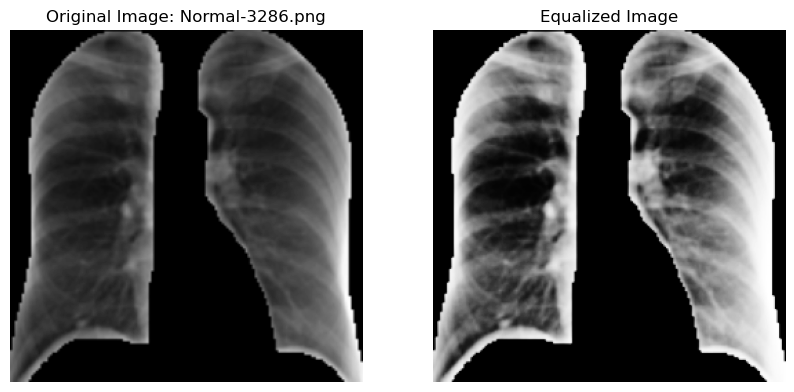

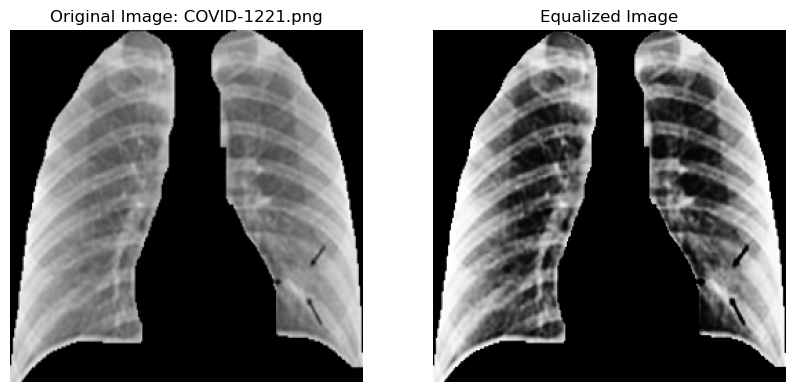

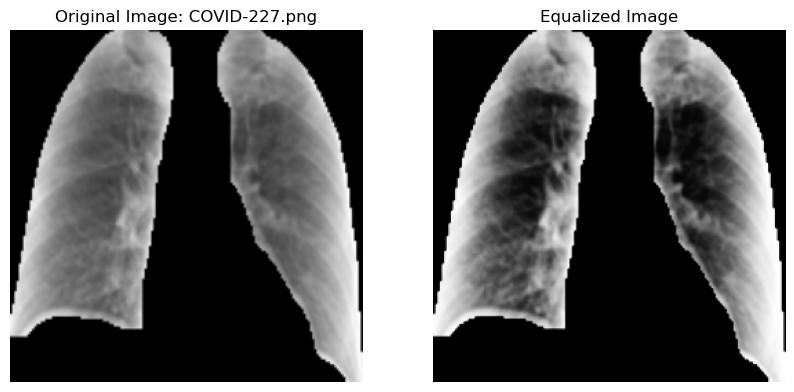

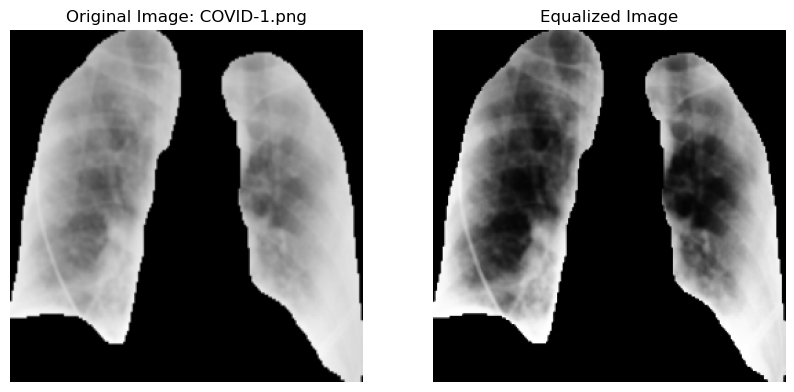

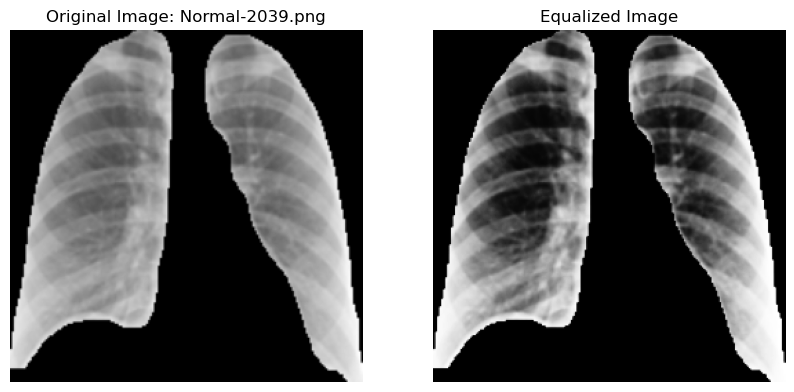

In [27]:

input_directory = 'Cropped_Images2'
image_paths = [os.path.join(input_directory, fname) for fname in os.listdir(input_directory)]
equalized_images = process_images_with_hist_eq(image_paths)


input_directory = 'Cropped_Images2'
plot_histogram_equalization(input_directory, num_images=5)

In [28]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
def sample_images_and_masks(paths, sample_sizes):
    image_paths = []
    mask_paths = []
    for (image_dir, mask_dir) in paths:
        category = os.path.basename(os.path.dirname(image_dir))
        num_samples = sample_sizes.get(category, 0)
        
     
        image_files = sorted(os.listdir(image_dir))
        mask_files = sorted(os.listdir(mask_dir))
        sampled_indices = np.random.choice(len(image_files), num_samples, replace=False)
        image_paths.extend([os.path.join(image_dir, image_files[i]) for i in sampled_indices])
        mask_paths.extend([os.path.join(mask_dir, mask_files[i]) for i in sampled_indices])
    
    return image_paths, mask_paths
def get_predicted_mask(image_path, model):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_image(image, channels=1, expand_animations=False)
    image = tf.image.resize(image, (256, 256))
    image = tf.cast(image, tf.float32) / 255.0 
    image = tf.expand_dims(image, axis=0)  # Add batch dimension

    # Predict the mask
    predicted_mask = model.predict(image)
    predicted_mask = tf.squeeze(predicted_mask)  # Remove batch dimension
    return predicted_mask.numpy()

def has_holes(mask, max_hole_size=50):
    binary_mask = (mask > 0.5).astype(np.uint8)

    # Invert the mask to find holes
    inverted_mask = 1 - binary_mask

    # Find connected components in the inverted mask
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(inverted_mask, connectivity=8)

    # Check for small holes
    for label in range(1, num_labels):
        if stats[label, cv2.CC_STAT_AREA] <= max_hole_size:
            return True
    return False
def fill_vertical_gaps(mask, max_gap=25):
    binary_mask = np.squeeze(mask)
    binary_mask = (binary_mask > 0.5).astype(np.uint8)

    if binary_mask.ndim != 2:
        raise ValueError("Mask must be a 2D array")

    # vertical kernel 
    kernel = np.ones((max_gap, 1), np.uint8)

    # Apply closing operation to fill vertical gaps
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Exclude filling gaps at the borders
    closed_mask[:max_gap, :] = binary_mask[:max_gap, :]
    closed_mask[-max_gap:, :] = binary_mask[-max_gap:, :]

    return closed_mask

def fill_horizontal_gaps(mask, max_gap=25):
    binary_mask = (mask > 0.5).astype(np.uint8)
    horizontal_kernel = np.ones((1, max_gap), np.uint8)
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, horizontal_kernel)
    closed_mask[:, :max_gap] = binary_mask[:, :max_gap]
    closed_mask[:, -max_gap:] = binary_mask[:, -max_gap:]

    return closed_mask





import numpy as np
import tensorflow as tf

def process_lung_images_with_masks(image_paths, predicted_masks, target_size=(256, 256), threshold=0.5, remove_non_lung_areas=True, padding=0):
    """
    Takes predicted masks instead of model
    """
    processed_images = []

    for image_path, predicted_mask in zip(image_paths, predicted_masks):
        image = tf.io.read_file(image_path)
        image = tf.io.decode_image(image, channels=1, expand_animations=False)
        image = tf.image.resize(image, target_size)
        image = tf.cast(image, tf.float32) / 255.0

        predicted_mask = tf.image.resize(predicted_mask, target_size)
        predicted_mask = tf.squeeze(predicted_mask)

        binary_mask = (predicted_mask > threshold).numpy().astype(np.uint8)

        if remove_non_lung_areas:
            masked_image = np.squeeze(image.numpy()) * binary_mask
        else:
            masked_image = np.squeeze(image.numpy())

        coords = np.column_stack(np.where(binary_mask > 0))
        if coords.size == 0:
            cropped_image = masked_image
        else:
            y_min, x_min = coords.min(axis=0)[:2]
            y_max, x_max = coords.max(axis=0)[:2]
            cropped_image = masked_image[y_min:y_max+1, x_min:x_max+1]

            # Ensure the cropped image has 3 dimension
            if len(cropped_image.shape) == 2:
                cropped_image = np.expand_dims(cropped_image, axis=-1)

            # Add padding to the left and right sides
            padded_image = tf.image.pad_to_bounding_box(
                tf.convert_to_tensor(cropped_image, dtype=tf.float32),
                offset_height=0,
                offset_width=padding,
                target_height=cropped_image.shape[0],
                target_width=cropped_image.shape[1] + 2 * padding
            )

        padded_image = tf.image.resize(padded_image, target_size)
        processed_images.append(padded_image.numpy())

    return np.array(processed_images)


def clear_directory(directory):
    """Remove all files in the specified directory."""
    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)  # Remove the file
        except Exception as e:
            print(f'Failed to delete {file_path}. Reason: {e}')

def pipeline_remove_fill_crop2(paths, model, output_dir, remove_heart=True):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    # Clear the directory before processing
    clear_directory(output_dir)

    for path in paths:
        predicted_mask = get_predicted_mask(path, model)

        if has_holes(predicted_mask):
            vertically_filled_mask = fill_vertical_gaps(predicted_mask, max_gap=19)
            filled_mask = fill_horizontal_gaps(vertically_filled_mask, max_gap=13)
            filled_mask = fill_vertical_gaps(filled_mask, max_gap=12)
        else:
            filled_mask = predicted_mask

        refined_mask = refine_mask(filled_mask, min_size=800)
        refined_mask = refined_mask.reshape((1, 256, 256, 1))

        cropped_image = process_lung_images_with_masks(
            np.array([path]), 
            np.array([refined_mask]), 
            remove_non_lung_areas=remove_heart, 
            target_size=(256, 256), 
            threshold=0.5
        )[0]

        filename = os.path.basename(path)
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, (cropped_image * 255).astype(np.uint8))


def histogram_equalization(image):
    if isinstance(image, tf.Tensor):
        image_np = image.numpy()
    else:
        image_np = image
    
    if len(image_np.shape) == 3 and image_np.shape[-1] == 1:
        image_np = image_np.squeeze()
    elif len(image_np.shape) == 3 and image_np.shape[-1] > 1:
        image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    
    image_np = (image_np * 255).astype(np.uint8)
    equalized_image = cv2.equalizeHist(image_np)
    equalized_image = equalized_image.astype(np.float32) / 255.0
    
    if len(image.shape) == 3 and image.shape[-1] == 1:
        equalized_image = np.expand_dims(equalized_image, axis=-1)
    
    return equalized_image


def pipeline_remove_fill_crop(paths, model, output_dir=None, equalize=False, remove_heart=True, return_masks=False):
    refined_masks = []

    if output_dir:
        # Ensure the output directory exists
        os.makedirs(output_dir, exist_ok=True)
        # Clear the directory before processing
        clear_directory(output_dir)

    for path in paths:
        predicted_mask = get_predicted_mask(path, model)

        if has_holes(predicted_mask):
            vertically_filled_mask = fill_vertical_gaps(predicted_mask, max_gap=19)
            filled_mask = fill_horizontal_gaps(vertically_filled_mask, max_gap=13)
            filled_mask = fill_vertical_gaps(filled_mask, max_gap=12)
        else:
            filled_mask = predicted_mask

        refined_mask = refine_mask(filled_mask, min_size=800)
        refined_mask = refined_mask.reshape((1, 256, 256, 1))
        refined_masks.append(refined_mask)

        cropped_image = process_lung_images_with_masks(
            np.array([path]), 
            np.array([refined_mask]), 
            remove_non_lung_areas=remove_heart, 
            target_size=(256, 256), 
            threshold=0.5
        )[0]

        if equalize:
            cropped_image = histogram_equalization(cropped_image)

        if output_dir:
            filename = os.path.basename(path)
            output_path = os.path.join(output_dir, filename)
            
            # Convert to NumPy array if it's a TensorFlow tensor
            if isinstance(cropped_image, tf.Tensor):
                cropped_image = cropped_image.numpy()
            
            # Ensure the image is in the correct format for saving
            save_image = (cropped_image * 255).astype(np.uint8)
            if len(save_image.shape) == 3 and save_image.shape[-1] == 1:
                save_image = save_image.squeeze()
            
            cv2.imwrite(output_path, save_image)

    if return_masks:
        return refined_masks


def refine_mask(mask, min_size=800):

    # Ensure the mask is binary
    binary_mask = (mask > 0.5).astype(np.uint8)

    # Find connected components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

    # Create an empty mask to store the refined mask
    refined_mask = np.zeros_like(binary_mask)

    # Iterate over each component
    for label in range(1, num_labels):
        # Check the size of the component
        if stats[label, cv2.CC_STAT_AREA] >= min_size:
            # Keep components larger than min_size
            refined_mask[labels == label] = 1

    return refined_mask


RERUN=True
# Base directory for the dataset
base = os.path.join(os.getcwd(), "COVID-19_Radiography_Dataset")

# Paths to images and masks for each category
paths = [(os.path.join(base, 'Normal', 'images'), os.path.join(base, 'Normal', 'masks')),
    (os.path.join(base, 'COVID', 'images'), os.path.join(base, 'COVID', 'masks')),
    (os.path.join(base, 'Viral Pneumonia', 'images'), os.path.join(base, 'Viral Pneumonia', 'masks'))
]
sample_sizes = {
    'Normal': 20,
    'COVID': 20,
    'Viral Pneumonia': 20
}
directory_names=['Cropped_Black_Background','Cropped_Black_HistEq','Just_Cropped','Just_Cropped_HistEq']
directory_names=['Cropped_Black_Background','Cropped_Black_HistEq','Just_Cropped','Just_Cropped_HistEq']
isHist=[False,True,False,True]
heart_options=[True,True,False,False]
image_paths, mask_paths = sample_images_and_masks(paths, sample_sizes)

model = tf.keras.models.load_model('best_model6.keras')  # Load your trained U-Net model
if RERUN:
    for directory, hist_option, heart_option in zip(directory_names,isHist,heart_options):
        output_directory = directory
        pipeline_remove_fill_crop(image_paths, model, output_dir=output_directory,equalize=hist_option, remove_heart=heart_option)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [29]:
def plot_random_image(directory, title=None, search_for='Normal-'):

    # List all files in the directory
    files = [f for f in os.listdir(directory) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
    
    for image_file in files:
        if search_for in image_file:
            random_file_path=os.path.join(directory, image_file)
            relative_path=image_file
            break
    #file_path = os.path.join(directory, random_file)

    image = cv2.imread(random_file_path)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Plot the image
    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    

    plt.title(f"Random image from {os.path.basename(directory)}  Label {get_label_from_path_name(relative_path)} File: {relative_path}")
    
    plt.show()

# Results

# Cropped Normal X ray (No equalization)

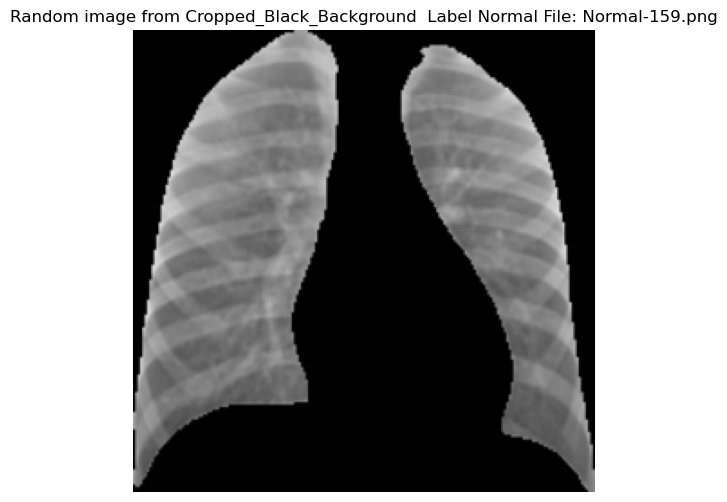

In [30]:

directory_names = ['Cropped_Black_Background',  'Cropped_Black_HistEq']


plot_random_image(directory_names[0], title='Cropped')

# Cropped Normal (With Equalization)

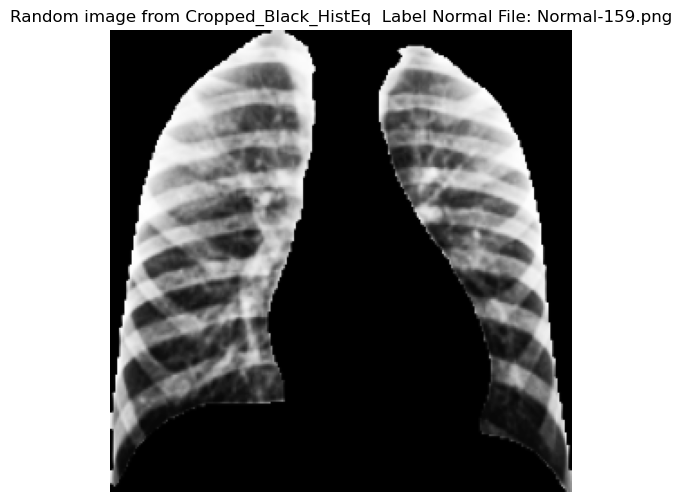

In [31]:
plot_random_image(directory_names[1], title='Cropped Histogram Equalized')

# Cropped Covid (No Equalization)

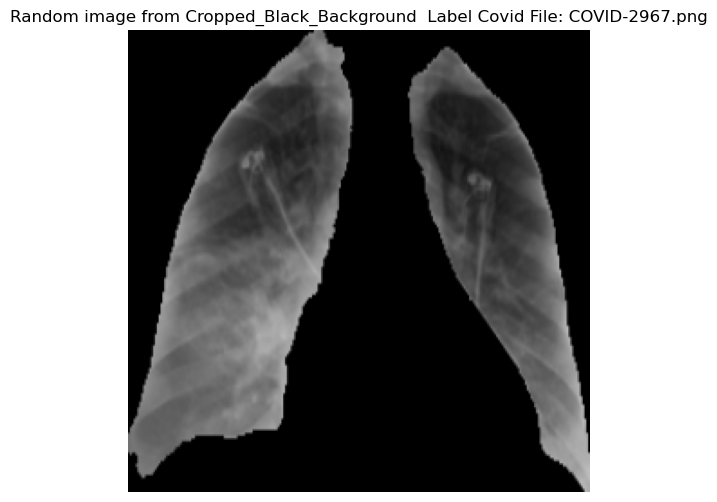

In [32]:
plot_random_image(directory_names[0], title='Cropped', search_for='COVID-')

# Cropped Covid (With equalization)

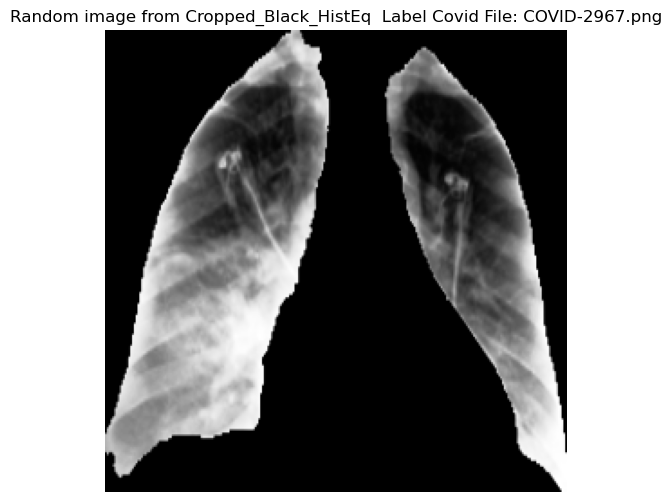

In [33]:
plot_random_image(directory_names[1], title='Cropped Histogram Equalized',search_for='COVID-')

# Viral Pneumonia (Without Equalization)
# Viral Pneumonia (With Equalization)

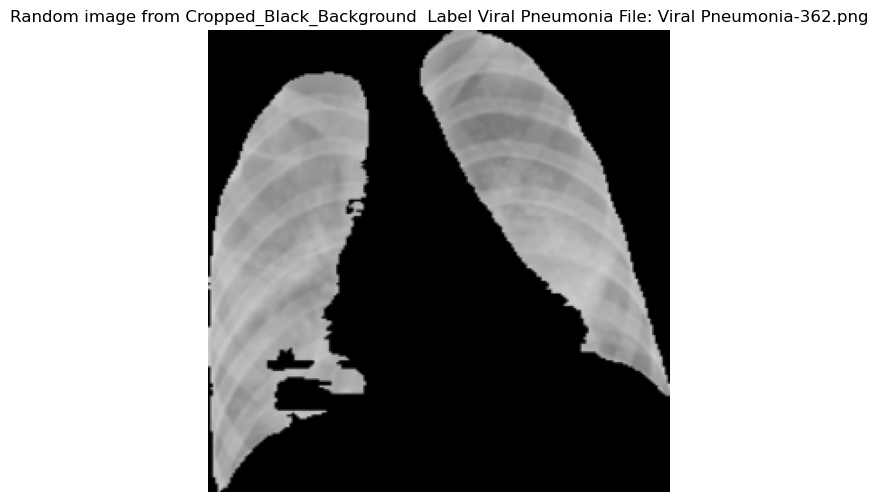

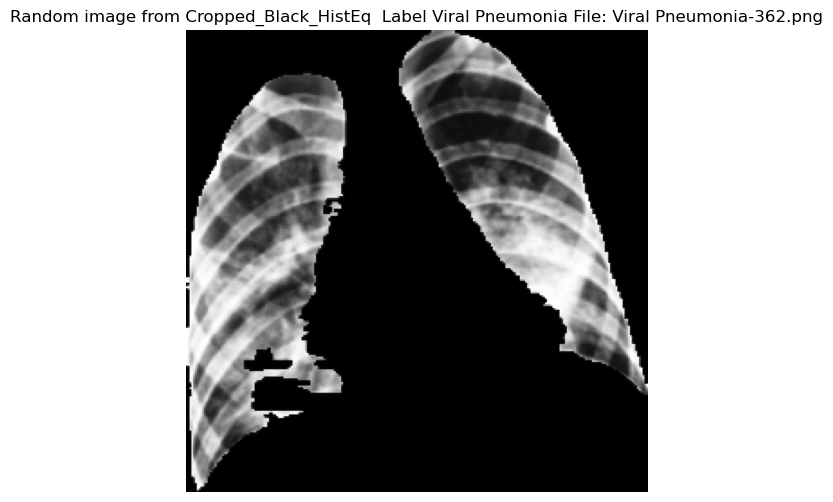

In [34]:
plot_random_image(directory_names[0], title='Cropped',search_for='Viral Pneumonia-')
plot_random_image(directory_names[1], title='Cropped Histogram Equalized',search_for='Viral Pneumonia-')